In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pip install -q kaggle
!mkdir ~/.kaggle kaggle/ kaggle/input/ kaggle/input/plant-pathology-2020-fgvc7/
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle competitions download -c plant-pathology-2020-fgvc7
!unzip plant-pathology-2020-fgvc7.zip
!mv images/ sample_submission.csv test.csv train.csv kaggle/input/plant-pathology-2020-fgvc7/; rm -rf plant-pathology-2020-fgvc7.zip

Mounted at /content/drive
Archive:  plant-pathology-2020-fgvc7.zip
  inflating: images/Test_0.jpg       
  inflating: images/Test_1.jpg       
  inflating: images/Test_10.jpg      
  inflating: images/Test_100.jpg     
  inflating: images/Test_1000.jpg    
  inflating: images/Test_1001.jpg    
  inflating: images/Test_1002.jpg    
  inflating: images/Test_1003.jpg    
  inflating: images/Test_1004.jpg    
  inflating: images/Test_1005.jpg    
  inflating: images/Test_1006.jpg    
  inflating: images/Test_1007.jpg    
  inflating: images/Test_1008.jpg    
  inflating: images/Test_1009.jpg    
  inflating: images/Test_101.jpg     
  inflating: images/Test_1010.jpg    
  inflating: images/Test_1011.jpg    
  inflating: images/Test_1012.jpg    
  inflating: images/Test_1013.jpg    
  inflating: images/Test_1014.jpg    
  inflating: images/Test_1015.jpg    
  inflating: images/Test_1016.jpg    
  inflating: images/Test_1017.jpg    
  inflating: images/Test_1018.jpg    
  inflating: images/T

 PRETRAITEMENT ET ANALYSE EXPLORATOIRE

In [ ]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

base_path = 'kaggle/input/plant-pathology-2020-fgvc7/images/'
def generate_path(image_id):
   return f'{base_path}{image_id}.jpg'

test_df = pd.read_csv('kaggle/input/plant-pathology-2020-fgvc7/test.csv')
train_df = pd.read_csv('kaggle/input/plant-pathology-2020-fgvc7/train.csv')

test_df['img_path'] = test_df['image_id'].apply(generate_path)
train_df['img_path'] = train_df['image_id'].apply(generate_path)

Train shape: (1821, 6)
Test shape: (1821, 2)


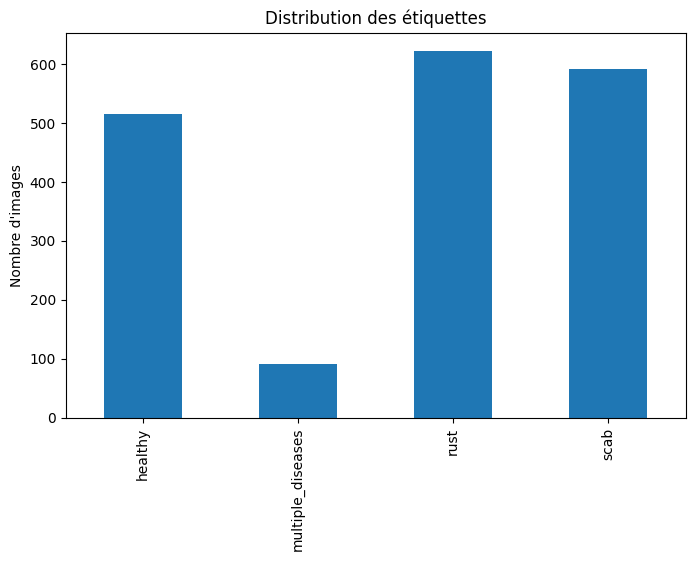

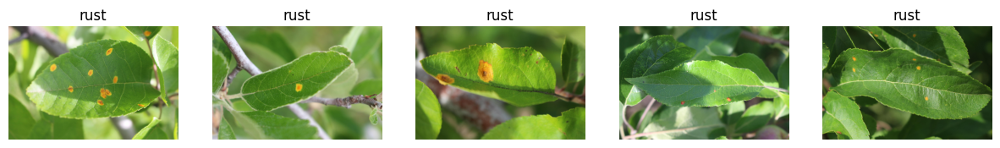

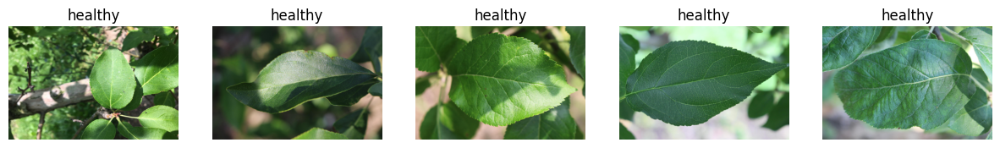

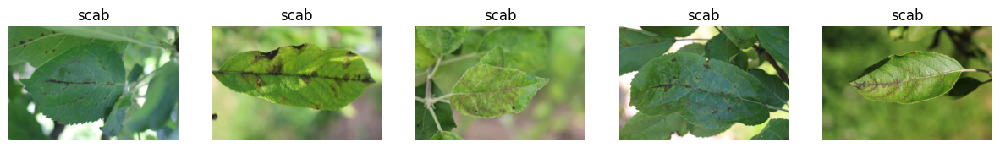

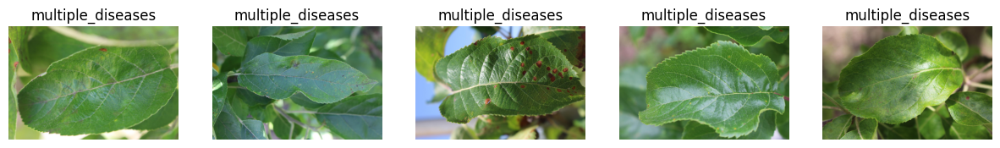

In [ ]:
import random

print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)

label_cols = ['healthy', 'multiple_diseases', 'rust', 'scab']

train_df[label_cols].sum().plot(kind='bar', figsize=(8,5))
plt.title("Distribution des étiquettes")
plt.ylabel("Nombre d'images")
plt.show()

def show_images_by_label(label, n=5):
    samples = train_df[train_df[label] == 1].sample(n)
    plt.figure(figsize=(15, 5))
    for i, (_, row) in enumerate(samples.iterrows()):
        img = cv2.imread(row['img_path'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')
    plt.show()

show_images_by_label("rust", 5)
show_images_by_label("healthy", 5)
show_images_by_label("scab", 5)
show_images_by_label("multiple_diseases", 5)

Le dataset et tres déséquilibré donc pour evaluer on ne peut pas se baser sur l'accuracy basons nous plutot sur l'AUC

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import cv2
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

In [ ]:
def load_images_and_labels(df, label_cols, img_size=(128, 128)):
    X = []
    y = []

    for _, row in df.iterrows():
        img = cv2.imread(row['img_path'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, img_size)
        X.append(img)
        y.append(row[label_cols].values)

    X = np.array(X, dtype='float32') / 255.0
    y = np.array(y, dtype='float32')

    return X, y

##### augmentation des données

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def get_data_generators(X, y, use_augmentation=False, batch_size=32):
    if use_augmentation:
        train_datagen = ImageDataGenerator(
            rotation_range=20,
            width_shift_range=0.1,
            height_shift_range=0.1,
            shear_range=0.1,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest',
            validation_split=0.2
        )
    else:
        train_datagen = ImageDataGenerator(validation_split=0.2)

    train_generator = train_datagen.flow(
        X, y,
        batch_size=batch_size,
        subset='training'
    )

    val_generator = train_datagen.flow(
        X, y,
        batch_size=batch_size,
        subset='validation',
        shuffle=False
    )

    return train_generator, val_generator


1. **CNN**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import SGD, RMSprop, Adam
try:
    from tensorflow.keras.optimizers import AdamW
except ImportError:
    AdamW = None

def create_cnn_model_dynamic(input_shape, num_classes, num_blocks=2, base_filters=32,
                             use_dropout=False, opt='adam', l2_lambda=0.0, learning_rate=3e-4, momentum=0.0):

    model = Sequential()
    filters = base_filters

    for i in range(num_blocks):
        model.add(Conv2D(filters, (3, 3), activation='relu', padding='same',
                         input_shape=input_shape if i == 0 else None,
                         kernel_regularizer=regularizers.l2(l2_lambda)))
        model.add(MaxPooling2D((2, 2)))
        filters *= 2

    model.add(Flatten())
    model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(l2_lambda)))

    if use_dropout:
        model.add(Dropout(0.5))

    model.add(Dense(num_classes, activation='softmax', kernel_regularizer=regularizers.l2(l2_lambda)))

    # Choix de l'optimiseur
    if opt == 'sgd':
        optimizer = SGD(learning_rate=learning_rate, momentum=momentum)
    elif opt == 'rmsprop':
        optimizer = RMSprop(learning_rate=learning_rate)
    elif opt == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif opt == 'adamw' and AdamW is not None:
        optimizer = AdamW(learning_rate=learning_rate, weight_decay=5e-4)
    else:
        raise ValueError("Optimiseur non supporté ou AdamW non disponible.")

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
import os
import datetime
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from sklearn.metrics import classification_report

def run_experiment(seed=42, img_size=(32, 32), batch_size=128, epochs=100, use_dropout=False,
                   num_blocks=2, base_filters=8, opt='adam', l2_lambda=0.0, learning_rate=3e-4,
                   momentum=0.0, save_model=True, use_augmentation=False):

    set_seed(seed)

    X, y = load_images_and_labels(train_df, label_cols, img_size=img_size)
    train_gen, val_gen = get_data_generators(X, y, use_augmentation=use_augmentation, batch_size=batch_size)

    model = create_cnn_model_dynamic(
        input_shape=(img_size[0], img_size[1], 3),
        num_classes=len(label_cols),
        num_blocks=num_blocks,
        base_filters=base_filters,
        use_dropout=use_dropout,
        opt=opt,
        l2_lambda=l2_lambda,
        learning_rate=learning_rate,
        momentum=momentum
    )
    model.summary()

    timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    log_dir = (
        f"logs/cnn_blocks{num_blocks}_filters{base_filters}_dropout{use_dropout}_"
        f"opt{opt}_lr{learning_rate}_l2{l2_lambda}_mom{momentum}_use_augmentation{use_augmentation}"
    )
    tensorboard_cb = TensorBoard(log_dir=log_dir)
    early_stop = EarlyStopping(patience=10, restore_best_weights=True)

    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=epochs,
        callbacks=[tensorboard_cb, early_stop],
        verbose=2
    )

    if save_model:
        os.makedirs("save_models", exist_ok=True)
        model.save(f"save_models/model_blocks{num_blocks}_filters{base_filters}_opt{opt}_seed{seed}.keras")

    final_train_loss = history.history['loss'][-1]
    final_val_loss = history.history['val_loss'][-1]
    final_train_acc = history.history['accuracy'][-1]
    final_val_acc = history.history['val_accuracy'][-1]

    print(f"\nRésultats finaux [seed={seed}]")
    print(f"Train Loss : {final_train_loss:.4f} | Acc : {final_train_acc:.4f}")
    print(f"Val   Loss : {final_val_loss:.4f} | Acc : {final_val_acc:.4f}")

    val_gen.reset()
    y_true = []
    num_batches = len(val_gen)

    for i in range(num_batches):
        _, batch_labels = val_gen[i]
        y_true.extend(np.argmax(batch_labels, axis=1))

    y_true = np.array(y_true)

    val_gen.reset()
    y_pred_probs = model.predict(val_gen, steps=num_batches)
    y_pred = np.argmax(y_pred_probs, axis=1)


    print("\n=== Rapport de classification ===")
    print(classification_report(y_true, y_pred, target_names=label_cols))

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=label_cols, yticklabels=label_cols, cmap="Blues")
    plt.xlabel('Prédit')
    plt.ylabel('Réel')
    plt.title('Matrice de confusion')
    plt.show()

    try:
        y_true_bin = label_binarize(y_true, classes=np.arange(len(label_cols)))
        auc = roc_auc_score(y_true_bin, y_pred_probs, average='macro', multi_class='ovr')
        print(f"AUC (macro): {auc:.4f}")
    except Exception as e:
        print("Erreur lors du calcul de l'AUC :", e)


    return model, history

In [ ]:
def run_multiple_seeds(seed_list, **kwargs):
    results = []

    for seed in seed_list:
        print(f"\nLancement avec seed = {seed}...")
        model, history = run_experiment(seed=seed, **kwargs)

        final_val_acc = history.history['val_accuracy'][-1]
        final_val_loss = history.history['val_loss'][-1]

        results.append({
            'seed': seed,
            'val_accuracy': final_val_acc,
            'val_loss': final_val_loss,
        })

    print("\n=== Résumé des résultats ===")
    for res in results:
        print(f"Seed: {res['seed']} | Val Acc: {res['val_accuracy']:.4f} | Val Loss: {res['val_loss']:.4f}")

    val_accs = [r['val_accuracy'] for r in results]
    print(f"\nMoyenne Acc: {np.mean(val_accs):.4f} ± {np.std(val_accs):.4f}")

    return results


Lancement avec seed = 1...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_36 (Conv2D)                   │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_36 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_37 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_38 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_39 (MaxPooling2D)      │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 256)                 │       4,194,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,584,004 (17.49 MB)

 Trainable params: 4,584,004 (17.49 MB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
23/23 - 14s - 603ms/step - accuracy: 0.3116 - loss: 1.2564 - val_accuracy: 0.3187 - val_loss: 1.2625
Epoch 2/50
23/23 - 8s - 345ms/step - accuracy: 0.3452 - loss: 1.2383 - val_accuracy: 0.4451 - val_loss: 1.2271
Epoch 3/50
23/23 - 7s - 285ms/step - accuracy: 0.4029 - loss: 1.2127 - val_accuracy: 0.3214 - val_loss: 1.2587
Epoch 4/50
23/23 - 8s - 345ms/step - accuracy: 0.3775 - loss: 1.2239 - val_accuracy: 0.4423 - val_loss: 1.2007
Epoch 5/50
23/23 - 6s - 282ms/step - accuracy: 0.4605 - loss: 1.1682 - val_accuracy: 0.5027 - val_loss: 1.1460
Epoch 6/50
23/23 - 8s - 343ms/step - accuracy: 0.4454 - loss: 1.1805 - val_accuracy: 0.4588 - val_loss: 1.1798
Epoch 7/50
23/23 - 7s - 296ms/step - accuracy: 0.4530 - loss: 1.1683 - val_accuracy: 0.5000 - val_loss: 1.1521
Epoch 8/50
23/23 - 10s - 433ms/step - accuracy: 0.4997 - loss: 1.1387 - val_accuracy: 0.5604 - val_loss: 1.1149
Epoch 9/50
23/23 - 8s - 337ms/step - accuracy: 0.4791 - loss: 1.1519 - val_accuracy: 0.4753 - val_loss: 1.1672

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step

=== Rapport de classification ===
                   precision    recall  f1-score   support

          healthy       0.85      0.89      0.87        88
multiple_diseases       0.38      0.25      0.30        20
             rust       0.92      0.93      0.93       116
             scab       0.90      0.91      0.91       140

         accuracy                           0.88       364
        macro avg       0.76      0.75      0.75       364
     weighted avg       0.87      0.88      0.87       364



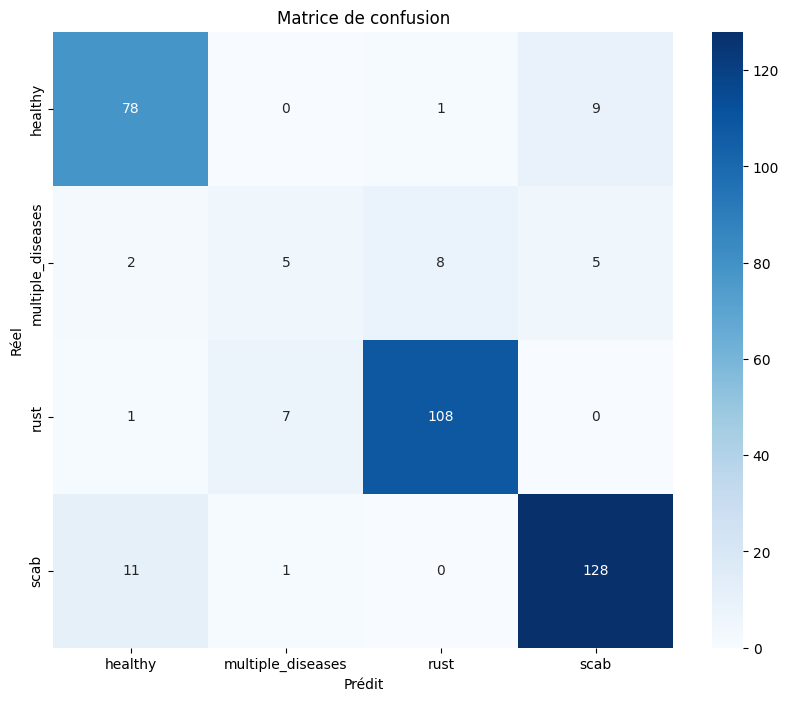

AUC (macro): 0.9285

Lancement avec seed = 11...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_40 (Conv2D)                   │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_40 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_41 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_42 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_43 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_43 (MaxPooling2D)      │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 256)                 │       4,194,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,584,004 (17.49 MB)

 Trainable params: 4,584,004 (17.49 MB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
23/23 - 14s - 600ms/step - accuracy: 0.3562 - loss: 1.2473 - val_accuracy: 0.4396 - val_loss: 1.2367
Epoch 2/50
23/23 - 6s - 281ms/step - accuracy: 0.4077 - loss: 1.2114 - val_accuracy: 0.4341 - val_loss: 1.1992
Epoch 3/50
23/23 - 8s - 344ms/step - accuracy: 0.4303 - loss: 1.1820 - val_accuracy: 0.4670 - val_loss: 1.1870
Epoch 4/50
23/23 - 7s - 289ms/step - accuracy: 0.4784 - loss: 1.1447 - val_accuracy: 0.5165 - val_loss: 1.1458
Epoch 5/50
23/23 - 8s - 344ms/step - accuracy: 0.5051 - loss: 1.1231 - val_accuracy: 0.5330 - val_loss: 1.0991
Epoch 6/50
23/23 - 7s - 323ms/step - accuracy: 0.5285 - loss: 1.0829 - val_accuracy: 0.5082 - val_loss: 1.2220
Epoch 7/50
23/23 - 9s - 404ms/step - accuracy: 0.5374 - loss: 1.0749 - val_accuracy: 0.6016 - val_loss: 1.0680
Epoch 8/50
23/23 - 8s - 344ms/step - accuracy: 0.5704 - loss: 1.0111 - val_accuracy: 0.6319 - val_loss: 0.9730
Epoch 9/50
23/23 - 6s - 281ms/step - accuracy: 0.6328 - loss: 0.9326 - val_accuracy: 0.6071 - val_loss: 1.0195


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step

=== Rapport de classification ===
                   precision    recall  f1-score   support

          healthy       0.84      0.86      0.85        88
multiple_diseases       0.44      0.20      0.28        20
             rust       0.93      0.93      0.93       116
             scab       0.88      0.93      0.90       140

         accuracy                           0.87       364
        macro avg       0.77      0.73      0.74       364
     weighted avg       0.86      0.87      0.86       364



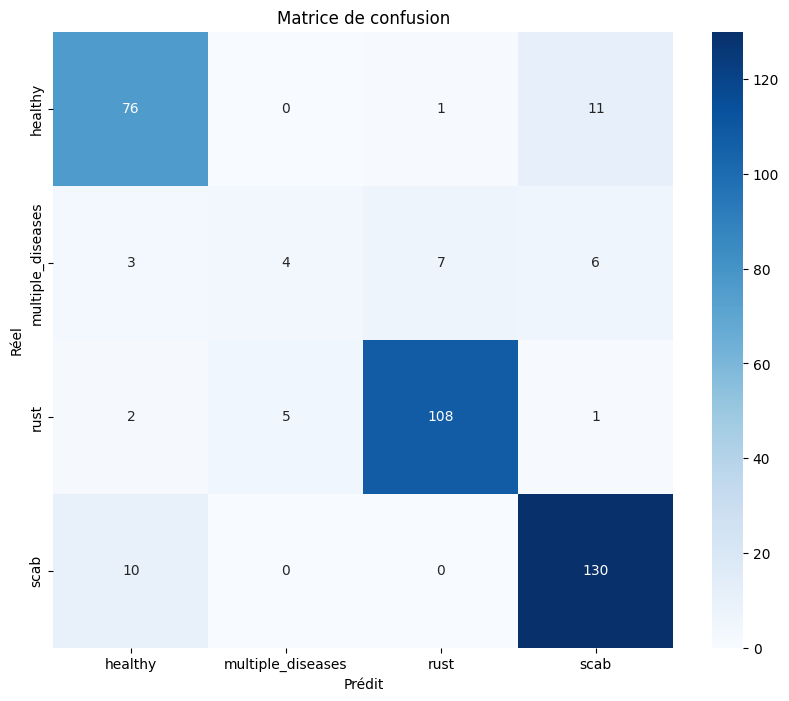

AUC (macro): 0.9409

Lancement avec seed = 21...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_44 (Conv2D)                   │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_44 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_45 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_45 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_46 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_46 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_47 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_47 (MaxPooling2D)      │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_11 (Flatten)                 │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 256)                 │       4,194,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,584,004 (17.49 MB)

 Trainable params: 4,584,004 (17.49 MB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
23/23 - 14s - 629ms/step - accuracy: 0.3356 - loss: 1.2489 - val_accuracy: 0.3599 - val_loss: 1.2401
Epoch 2/50
23/23 - 8s - 332ms/step - accuracy: 0.3864 - loss: 1.2179 - val_accuracy: 0.3956 - val_loss: 1.2232
Epoch 3/50
23/23 - 10s - 453ms/step - accuracy: 0.4324 - loss: 1.1842 - val_accuracy: 0.4148 - val_loss: 1.2058
Epoch 4/50
23/23 - 6s - 279ms/step - accuracy: 0.4530 - loss: 1.1657 - val_accuracy: 0.5027 - val_loss: 1.1544
Epoch 5/50
23/23 - 8s - 340ms/step - accuracy: 0.4825 - loss: 1.1402 - val_accuracy: 0.4505 - val_loss: 1.1969
Epoch 6/50
23/23 - 7s - 286ms/step - accuracy: 0.4997 - loss: 1.1200 - val_accuracy: 0.5495 - val_loss: 1.1134
Epoch 7/50
23/23 - 8s - 341ms/step - accuracy: 0.5278 - loss: 1.0742 - val_accuracy: 0.5467 - val_loss: 1.1142
Epoch 8/50
23/23 - 10s - 446ms/step - accuracy: 0.5786 - loss: 1.0152 - val_accuracy: 0.6236 - val_loss: 0.9855
Epoch 9/50
23/23 - 6s - 279ms/step - accuracy: 0.6211 - loss: 0.9698 - val_accuracy: 0.6429 - val_loss: 0.950

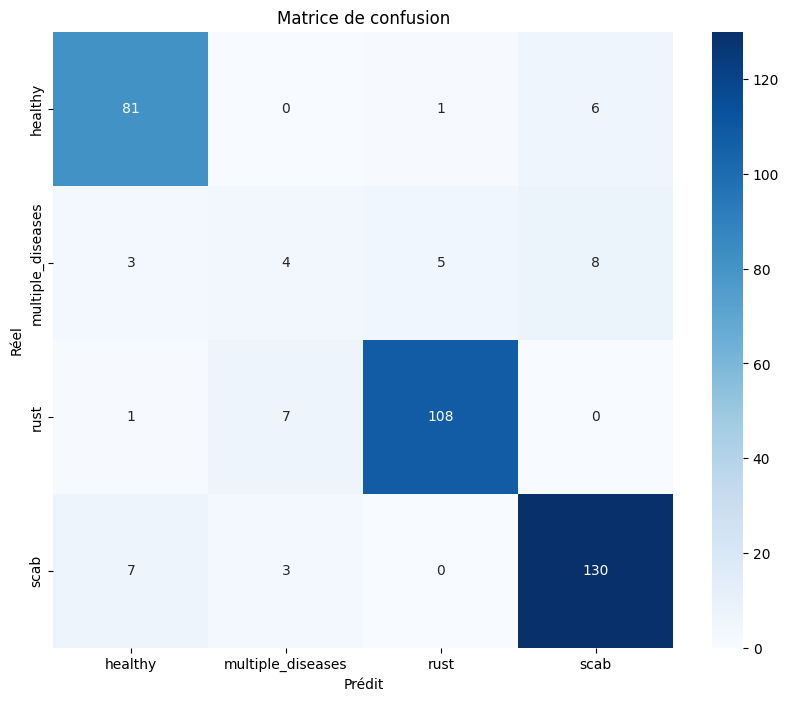

AUC (macro): 0.9413

Lancement avec seed = 42...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_48 (Conv2D)                   │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_48 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_49 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_50 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_51 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_51 (MaxPooling2D)      │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_12 (Flatten)                 │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 256)                 │       4,194,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,584,004 (17.49 MB)

 Trainable params: 4,584,004 (17.49 MB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
23/23 - 16s - 701ms/step - accuracy: 0.3185 - loss: 1.2618 - val_accuracy: 0.3434 - val_loss: 1.2599
Epoch 2/50
23/23 - 6s - 282ms/step - accuracy: 0.4139 - loss: 1.2174 - val_accuracy: 0.4588 - val_loss: 1.2037
Epoch 3/50
23/23 - 8s - 344ms/step - accuracy: 0.4331 - loss: 1.1831 - val_accuracy: 0.4451 - val_loss: 1.1809
Epoch 4/50
23/23 - 6s - 278ms/step - accuracy: 0.4544 - loss: 1.1742 - val_accuracy: 0.4890 - val_loss: 1.1856
Epoch 5/50
23/23 - 8s - 339ms/step - accuracy: 0.5045 - loss: 1.1120 - val_accuracy: 0.5577 - val_loss: 1.0988
Epoch 6/50
23/23 - 10s - 449ms/step - accuracy: 0.5553 - loss: 1.0454 - val_accuracy: 0.6044 - val_loss: 1.0101
Epoch 7/50
23/23 - 6s - 282ms/step - accuracy: 0.6253 - loss: 0.9353 - val_accuracy: 0.6758 - val_loss: 0.9029
Epoch 8/50
23/23 - 8s - 341ms/step - accuracy: 0.6575 - loss: 0.8617 - val_accuracy: 0.6099 - val_loss: 0.9777
Epoch 9/50
23/23 - 6s - 283ms/step - accuracy: 0.7193 - loss: 0.7442 - val_accuracy: 0.7170 - val_loss: 0.8770

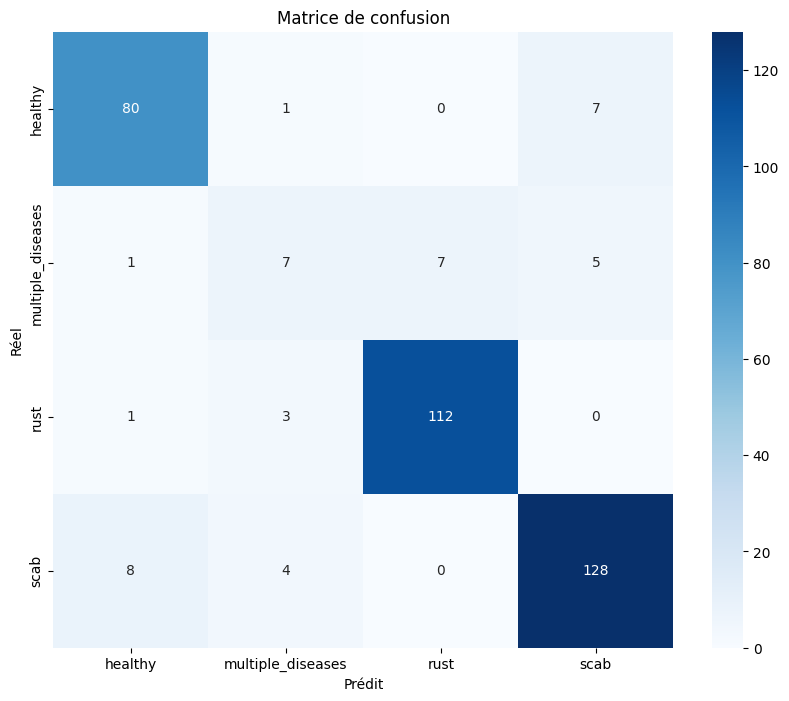

AUC (macro): 0.9407

Lancement avec seed = 123...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_52 (Conv2D)                   │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_53 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_53 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_54 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_54 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_55 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_55 (MaxPooling2D)      │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_13 (Flatten)                 │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 256)                 │       4,194,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,584,004 (17.49 MB)

 Trainable params: 4,584,004 (17.49 MB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
23/23 - 14s - 597ms/step - accuracy: 0.3507 - loss: 1.2625 - val_accuracy: 0.2418 - val_loss: 1.2516
Epoch 2/50
23/23 - 8s - 339ms/step - accuracy: 0.3445 - loss: 1.2408 - val_accuracy: 0.3462 - val_loss: 1.2658
Epoch 3/50
23/23 - 9s - 386ms/step - accuracy: 0.3336 - loss: 1.2408 - val_accuracy: 0.4011 - val_loss: 1.2432
Epoch 4/50
23/23 - 8s - 340ms/step - accuracy: 0.3713 - loss: 1.2225 - val_accuracy: 0.4148 - val_loss: 1.2179
Epoch 5/50
23/23 - 6s - 282ms/step - accuracy: 0.4420 - loss: 1.1878 - val_accuracy: 0.4670 - val_loss: 1.1583
Epoch 6/50
23/23 - 8s - 336ms/step - accuracy: 0.4859 - loss: 1.1492 - val_accuracy: 0.5495 - val_loss: 1.0982
Epoch 7/50
23/23 - 10s - 442ms/step - accuracy: 0.4894 - loss: 1.1432 - val_accuracy: 0.5824 - val_loss: 1.1106
Epoch 8/50
23/23 - 6s - 275ms/step - accuracy: 0.5594 - loss: 1.0738 - val_accuracy: 0.6319 - val_loss: 1.0209
Epoch 9/50
23/23 - 8s - 334ms/step - accuracy: 0.6156 - loss: 0.9500 - val_accuracy: 0.6538 - val_loss: 0.9405

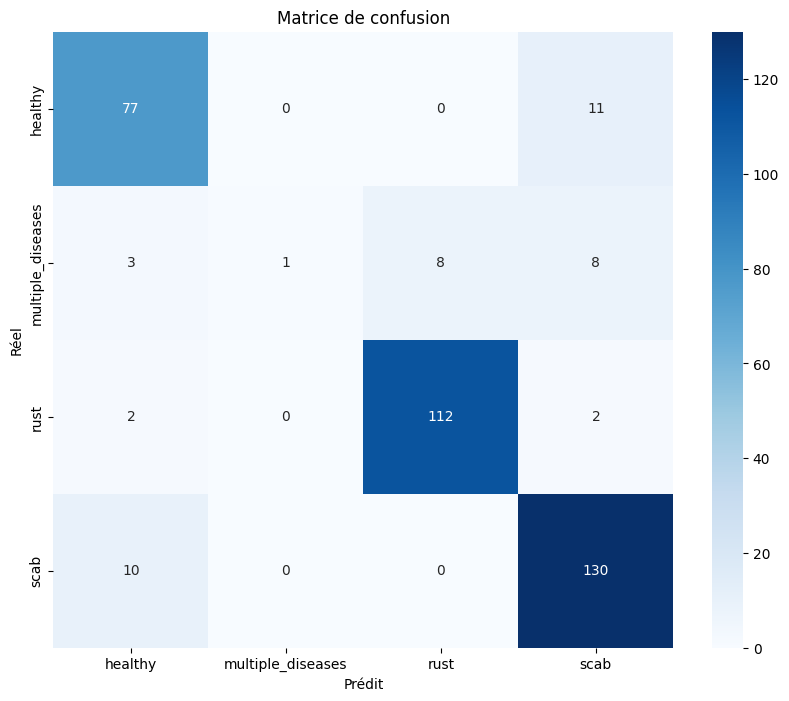

AUC (macro): 0.9373

=== Résumé des résultats ===
Seed: 1 | Val Acc: 0.8626 | Val Loss: 0.4638
Seed: 11 | Val Acc: 0.8764 | Val Loss: 0.4048
Seed: 21 | Val Acc: 0.8984 | Val Loss: 0.3918
Seed: 42 | Val Acc: 0.8956 | Val Loss: 0.3306
Seed: 123 | Val Acc: 0.8929 | Val Loss: 0.3668

Moyenne Acc: 0.8852 ± 0.0136
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
run_multiple_seeds(
    seed_list=[1, 11, 21, 42, 123],
    img_size=(128, 128),
    batch_size=64,
    epochs=50,
    num_blocks=4,
    base_filters=32,
    use_dropout=False,
    opt='adamw',
    learning_rate=3e-4,
    l2_lambda=0.00,
    momentum=0.0,
    use_augmentation=True
)
%load_ext tensorboard
%tensorboard --logdir logs